# Wine Quality Analysis

## Problem:
    The goal is to model the Wine Quality Based on physicochemical test
    Attribute information:
        1. Class
        2. Alcohol
        3. Malic acid 
        4. Ash 
        5. Alcalinity of ash
        6. Magnesium 
        7. Total phenols 
        8. Flavanoids 
        9. Nonflavanoid phenols
        10. Proanthocyanins 
        11. Color intensity 
        12. Hue
        13. diluted wines
        14. Proline 
        
#### We are finding the Quality of the Wine So our target variable is Class        

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv('winedataset.csv')
df.head(20)

,Class,Alcohol,Malic acid,Ash,Alcalinity of ash,Magnesium,Total phenols,Flavanoids,Nonflavanoid phenols,Proanthocyanins,Color intensity,Hue,diluted wines,Proline
0,1,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065
1,1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
2,1,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
3,1,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480
4,1,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735
5,1,14.20,1.76,2.45,15.2,112,3.27,3.39,0.34,1.97,6.75,1.05,2.85,1450
6,1,14.39,1.87,2.45,14.6,96,2.50,2.52,0.30,1.98,5.25,1.02,3.58,1290
7,1,14.06,2.15,2.61,17.6,121,2.60,2.51,0.31,1.25,5.05,1.06,3.58,1295
8,1,14.83,1.64,2.17,14.0,97,2.80,2.98,0.29,1.98,5.20,1.08,2.85,1045
9,1,13.86,1.35,2.27,16.0,98,2.98,3.15,0.22,1.85,7.22,1.01,3.55,1045


In [3]:
df.columns

Index(['Class', 'Alcohol', 'Malic acid', 'Ash', 'Alcalinity of ash',
       'Magnesium', 'Total phenols', 'Flavanoids', 'Nonflavanoid phenols',
       'Proanthocyanins', 'Color intensity', 'Hue', 'diluted wines',
       'Proline    '],
      dtype='object')

In [4]:
df.shape

(178, 14)

# EDA with Pandas Profiling

In [5]:
import pandas_profiling
pandas_profiling.ProfileReport(pd.read_csv('winedataset.csv'))

Summarize dataset:   0%|          | 0/27 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Cleansing the Data Using EDA analysis

In [6]:
df.isna().sum()

Class                   0
Alcohol                 0
Malic acid              0
Ash                     0
Alcalinity of ash       0
Magnesium               0
Total phenols           0
Flavanoids              0
Nonflavanoid phenols    0
Proanthocyanins         0
Color intensity         0
Hue                     0
diluted wines           0
Proline                 0
dtype: int64

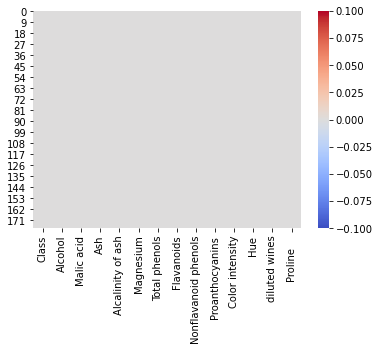

In [7]:
sns.heatmap(df.isna(), cmap = 'coolwarm')
plt.show()

The above plot shows only netural values which means no NAN values

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 178 entries, 0 to 177
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Class                 178 non-null    int64  
 1   Alcohol               178 non-null    float64
 2   Malic acid            178 non-null    float64
 3   Ash                   178 non-null    float64
 4   Alcalinity of ash     178 non-null    float64
 5   Magnesium             178 non-null    int64  
 6   Total phenols         178 non-null    float64
 7   Flavanoids            178 non-null    float64
 8   Nonflavanoid phenols  178 non-null    float64
 9   Proanthocyanins       178 non-null    float64
 10  Color intensity       178 non-null    float64
 11  Hue                   178 non-null    float64
 12  diluted wines         178 non-null    float64
 13  Proline               178 non-null    int64  
dtypes: float64(11), int64(3)
memory usage: 19.6 KB


In [9]:
df.describe()

,Class,Alcohol,Malic acid,Ash,Alcalinity of ash,Magnesium,Total phenols,Flavanoids,Nonflavanoid phenols,Proanthocyanins,Color intensity,Hue,diluted wines,Proline
count,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000
mean,1.938202,13.000618,2.336348,2.366517,19.494944,99.741573,2.295112,2.029270,0.361854,1.590899,5.058090,0.957449,2.611685,746.893258
std,0.775035,0.811827,1.117146,0.274344,3.339564,14.282484,0.625851,0.998859,0.124453,0.572359,2.318286,0.228572,0.709990,314.907474
min,1.000000,11.030000,0.740000,1.360000,10.600000,70.000000,0.980000,0.340000,0.130000,0.410000,1.280000,0.480000,1.270000,278.000000
25%,1.000000,12.362500,1.602500,2.210000,17.200000,88.000000,1.742500,1.205000,0.270000,1.250000,3.220000,0.782500,1.937500,500.500000
50%,2.000000,13.050000,1.865000,2.360000,19.500000,98.000000,2.355000,2.135000,0.340000,1.555000,4.690000,0.965000,2.780000,673.500000
75%,3.000000,13.677500,3.082500,2.557500,21.500000,107.000000,2.800000,2.875000,0.437500,1.950000,6.200000,1.120000,3.170000,985.000000
max,3.000000,14.830000,5.800000,3.230000,30.000000,162.000000,3.880000,5.080000,0.660000,3.580000,13.000000,1.710000,4.000000,1680.000000


# key observation:
     1. The mean is near to median (50th percentile) in all columns and in Proline, Color and Malic acid intensity mean is larger than median (50th percentile).
     2. There is a large difference in 75th percentile and max in Proline, Malic acid and Color intensity.
     3. The first and second observation suggest that there are outliers and skewness present in these three columns.

In [10]:
df.Class.unique()

array([1, 2, 3], dtype=int64)

In [11]:
df.Class.value_counts()  

2    71
1    59
3    48
Name: Class, dtype: int64

# key observation:
######                     The Above target variable is splitted into three categories Class 1 Class 2 Class 3


# Correlation With Class variable

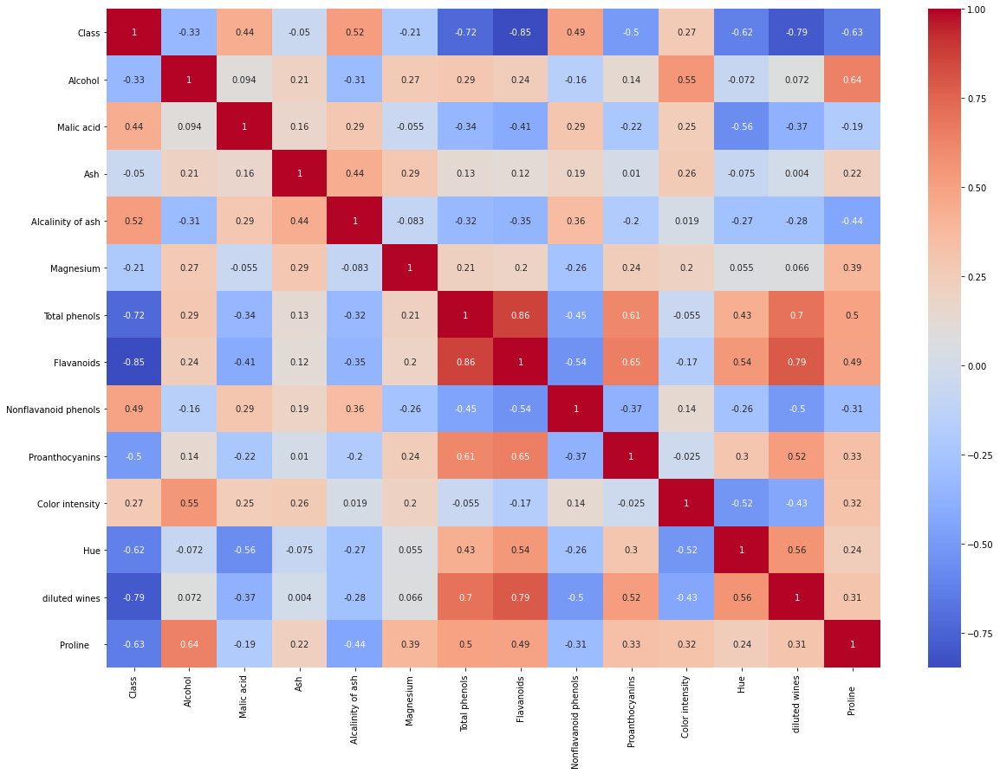

In [12]:
plt.figure(figsize=(20,14))
sns.heatmap(round(df.corr(),3), cmap='coolwarm', annot=True)
plt.show()

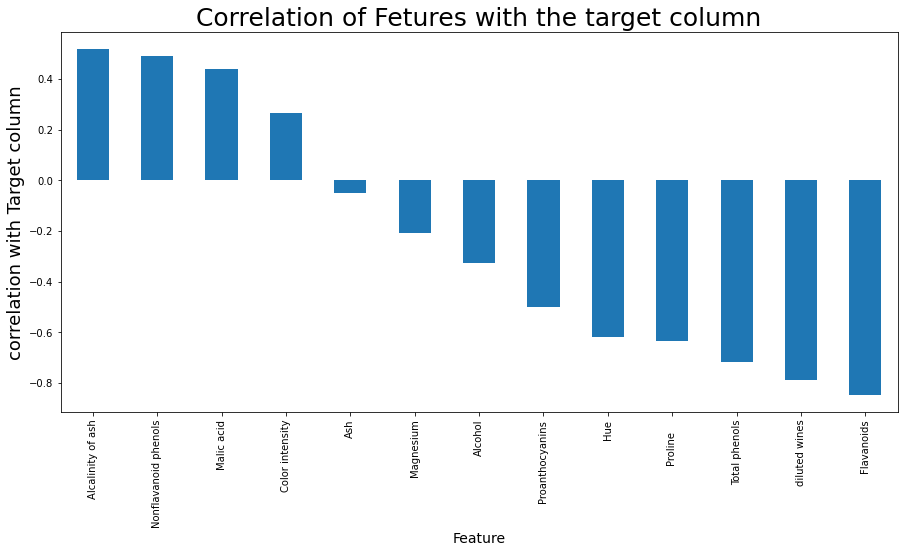

In [13]:
plt.figure(figsize=(15,7))
df.corr()["Class"].sort_values(ascending=False).drop(["Class"]).plot.bar()
plt.xlabel("Feature", fontsize= 14)
plt.ylabel("correlation with Target column", fontsize = 18)
plt.title("Correlation of Fetures with the target column", fontsize=25)
plt.show()

# key observation :

## Positive Correlation with the class:
       1. Alcalinity of ash 0.517859
       2. Nonflavanoid phenols 0.489109
       3. Malic acid 0.437776
       4. Color intensity 0.265668
      
## Negative Correlation with the class:
      1. Hue -0.617369
      2. diluted wines -0.788230	
      3. Proline -0.633717
      4. Alcohol -0.328222
      5. Ash -0.049643
      6. Magnesium -0.209179
      7. Total phenols -0.719163
      8. Flavanoids -0.847498
      9. Proanthocyanins -0.499130

# Unvariate Analysis

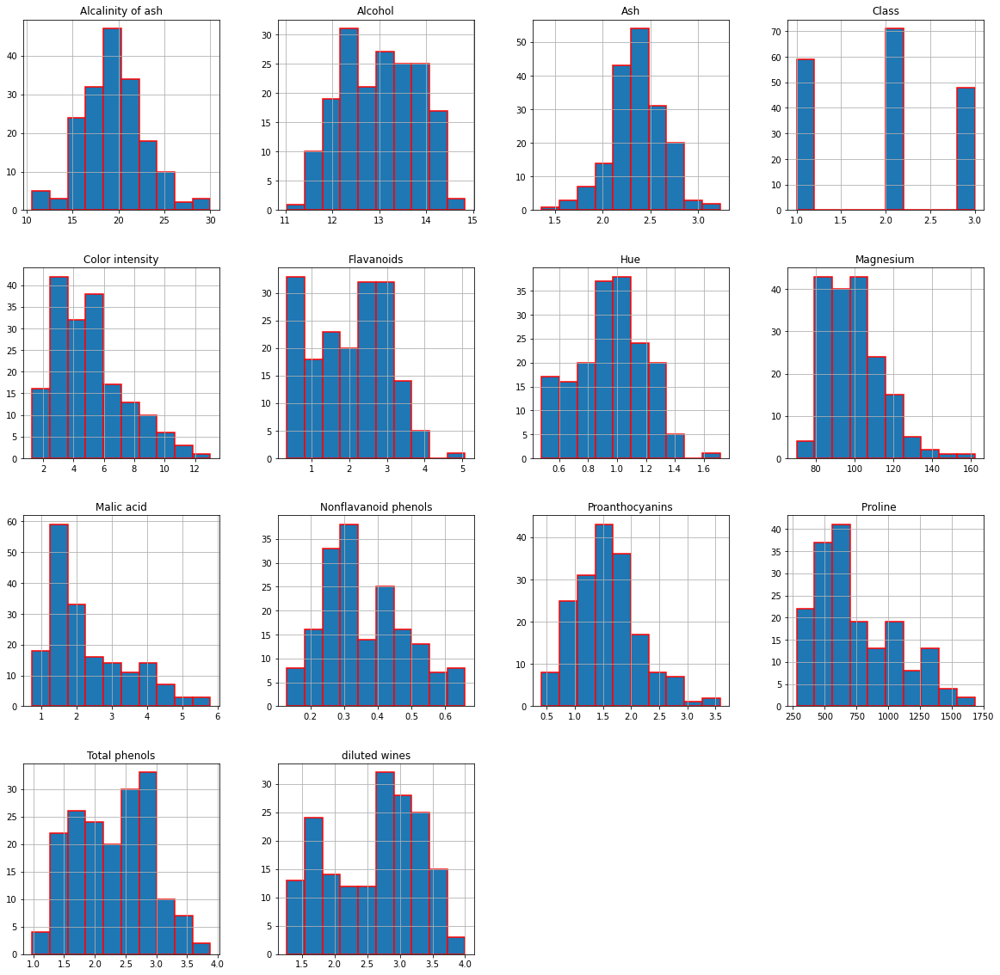

In [14]:
df.hist(edgecolor="red",linewidth= 1.5, figsize= (20,20))
plt.show()

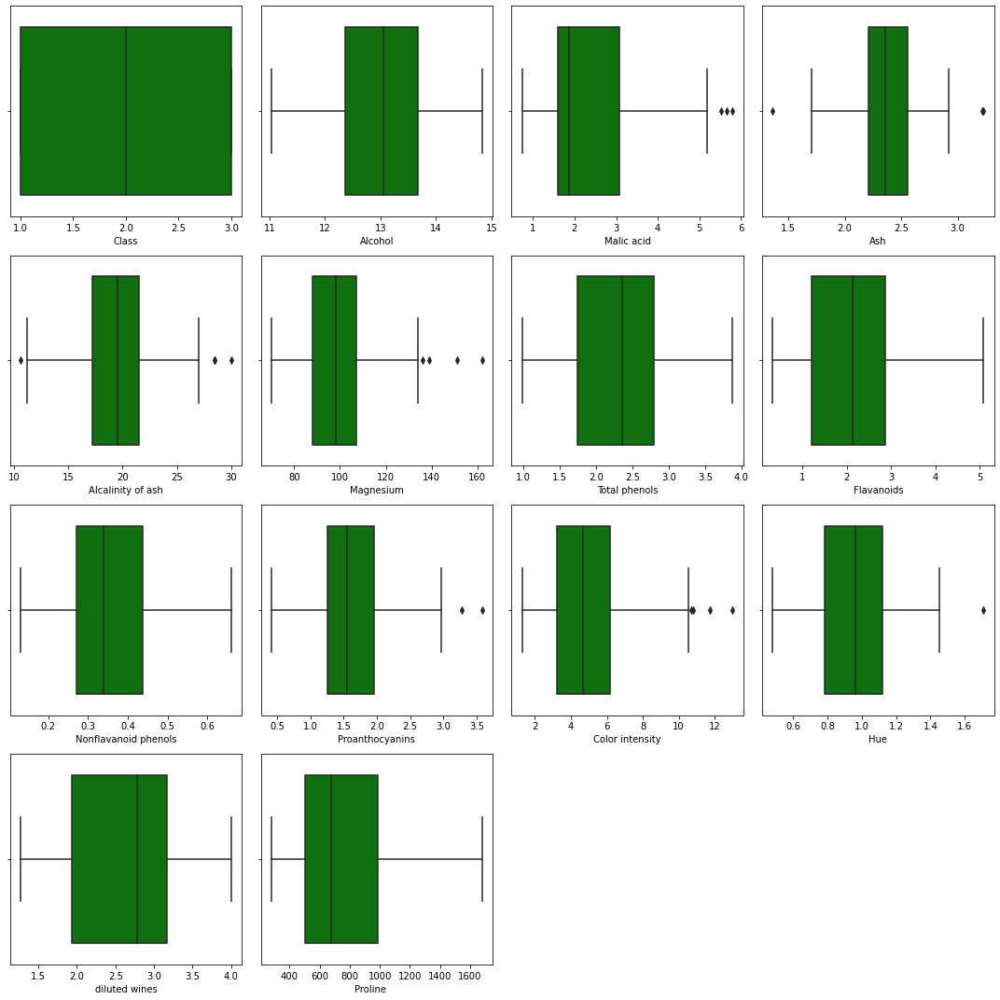

In [15]:
plt.figure(figsize=(15,15))
collist = df.columns.values
for i in range (0, len(collist)):
    plt.subplot(4,4,i+1)
    sns.boxplot(df[collist[i]], color = "green" , orient = "h")
    plt.tight_layout()
    

# Key Observations:
  7 variables have outliers as present in the figure
        1. Malic acid 
        2. Ash 
        3. Alcalinity of ash
        4. Magnesium 
        5. Proanthocyanins 
        6. Color intensity 
        7. Hue

# Removal of outliers

In [16]:
from scipy.stats import zscore
z = np.abs(zscore(df))
threshold = 3
df_new=df[(z<3).all(axis=1)]
df_new

,Class,Alcohol,Malic acid,Ash,Alcalinity of ash,Magnesium,Total phenols,Flavanoids,Nonflavanoid phenols,Proanthocyanins,Color intensity,Hue,diluted wines,Proline
0,1,14.23,1.71,2.43,15.6,127,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065
1,1,13.20,1.78,2.14,11.2,100,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050
2,1,13.16,2.36,2.67,18.6,101,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185
3,1,14.37,1.95,2.50,16.8,113,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480
4,1,13.24,2.59,2.87,21.0,118,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,3,13.71,5.65,2.45,20.5,95,1.68,0.61,0.52,1.06,7.70,0.64,1.74,740
174,3,13.40,3.91,2.48,23.0,102,1.80,0.75,0.43,1.41,7.30,0.70,1.56,750
175,3,13.27,4.28,2.26,20.0,120,1.59,0.69,0.43,1.35,10.20,0.59,1.56,835
176,3,13.17,2.59,2.37,20.0,120,1.65,0.68,0.53,1.46,9.30,0.60,1.62,840


In [17]:
print(f"Orginal Data {df.shape}\nAfter Removing outliers {df_new.shape}\nThe percentage of data loss {((178-168)/178)*100}%")

Orginal Data (178, 14)
After Removing outliers (168, 14)
The percentage of data loss 5.617977528089887%


Since the Loss of Data is ~ 5% we are Removing Outliers

BELOW GRAPH WILL SHOW THE SKEWNESS OF THE DATA


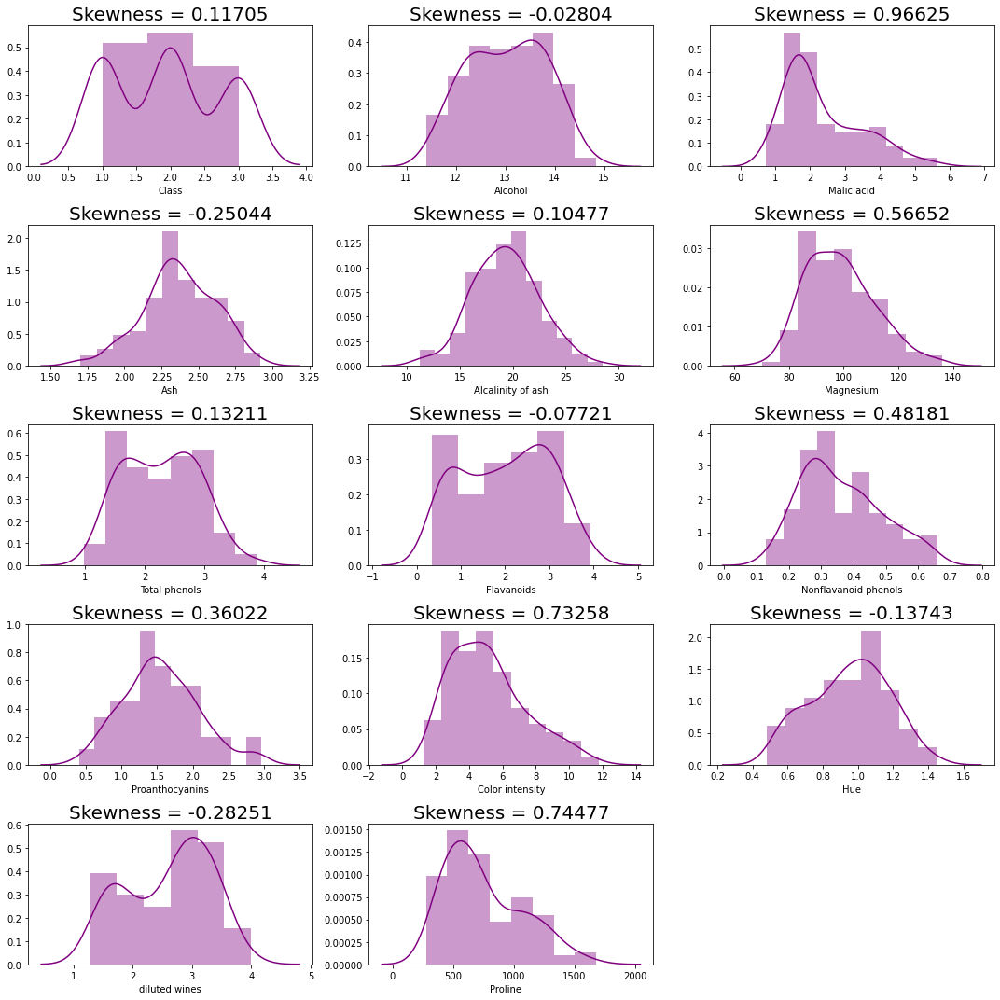

In [18]:
DF= df_new
print("BELOW GRAPH WILL SHOW THE SKEWNESS OF THE DATA")
plt.figure(figsize=(15,15))
for i in range (0, len(collist)):
    plt.subplot(5,3,i+1)
    plt.title(f"Skewness = {round(DF[collist[i]].skew(),5)}",fontsize=20)          
    sns.distplot(DF[collist[i]], color = "purple")
    plt.tight_layout()

# key observation:
    As said before skewness is present in the Proline, Malic Acid and Color Intensity, Megnesium

In [19]:
from scipy.stats import boxcox

In [20]:
DF['Color intensity']= boxcox(DF['Color intensity'])[0]
DF.Magnesium = boxcox(DF.Magnesium)[0]
DF['Proline    ']= boxcox(DF['Proline    '])[0]
DF['Malic acid']= boxcox(DF['Malic acid'])[0]

BELOW GRAPH WILL SHOW THE SKEWNESS OF THE DATA


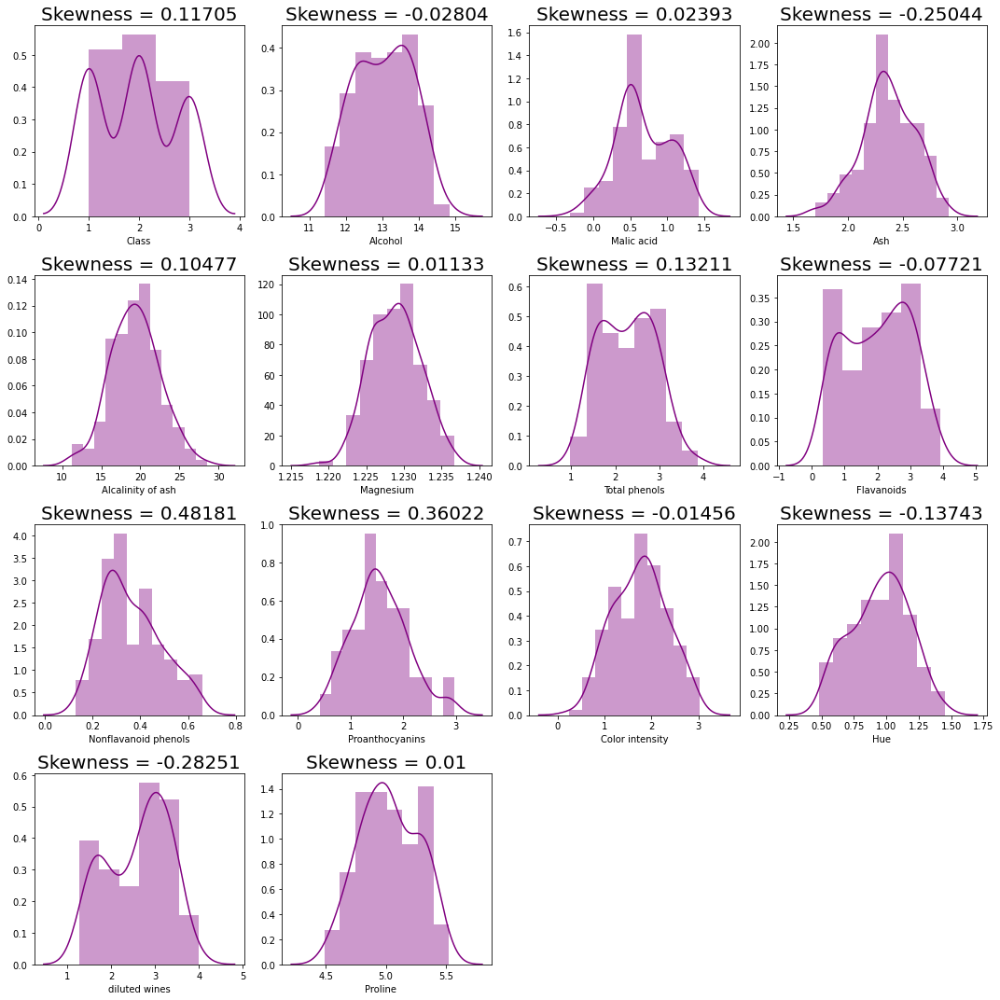

In [21]:
print("BELOW GRAPH WILL SHOW THE SKEWNESS OF THE DATA")
plt.figure(figsize=(15,15))
for i in range (0, len(collist)):
    plt.subplot(4,4,i+1)
    plt.title(f"Skewness = {round(DF[collist[i]].skew(),5)}",fontsize=20)         
    sns.distplot(DF[collist[i]], color = "purple")
    plt.tight_layout()

Skewness is removed but we will check removing of skewed data is affecting the correleration of the data

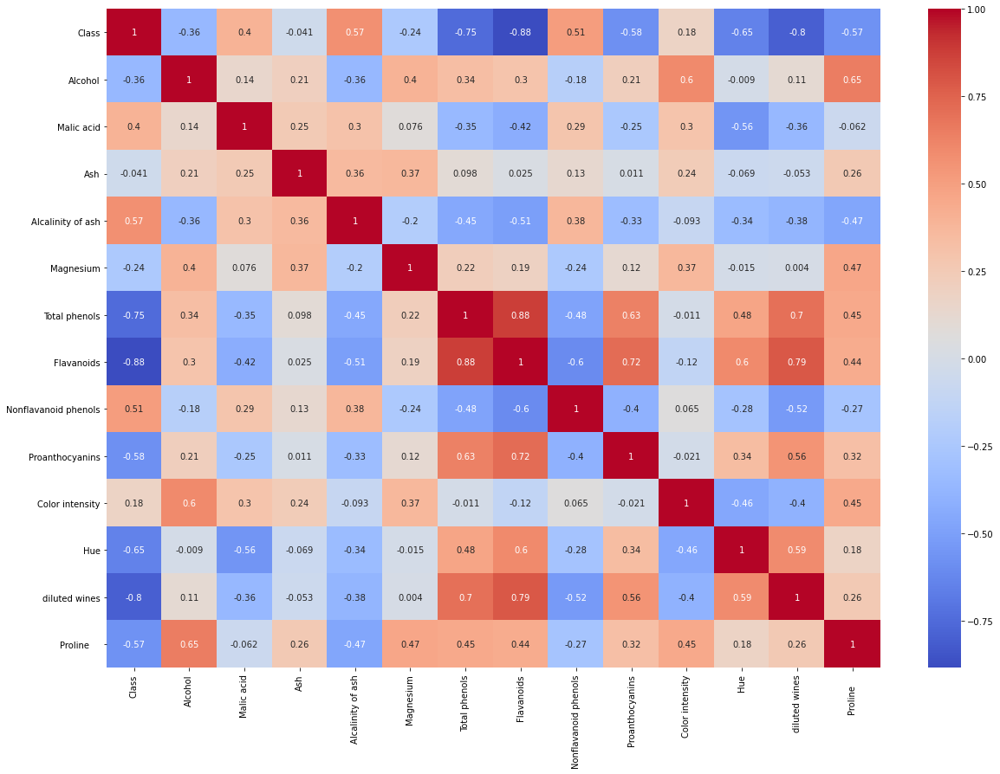

In [22]:
plt.figure(figsize=(20,14))
sns.heatmap(round(DF.corr(),3), cmap='coolwarm', annot=True)
plt.show()

Post the Removal of the Skewness there is not much deference in Colleration

# Multivariate Analysis

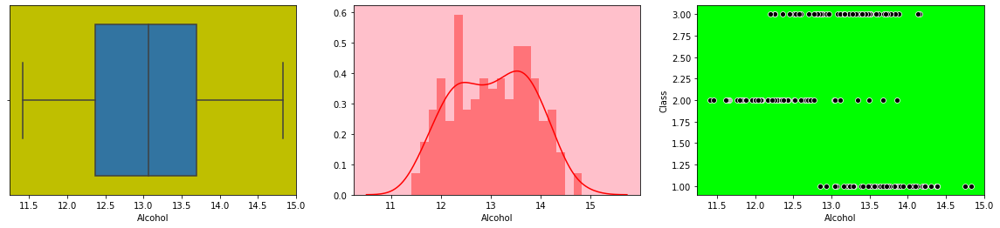

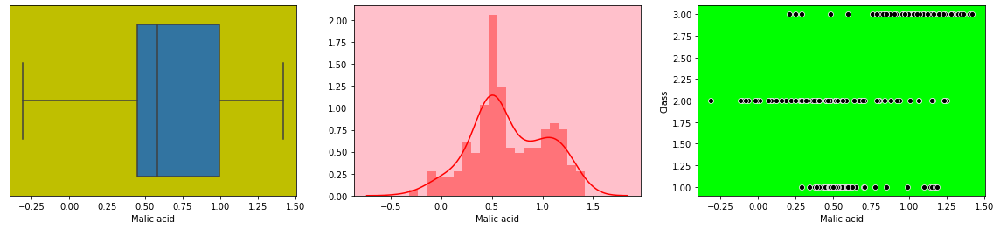

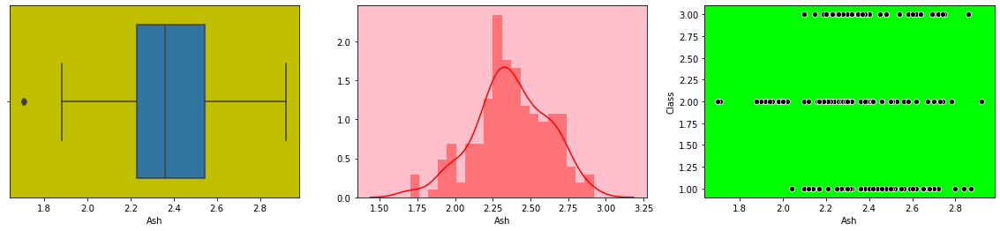

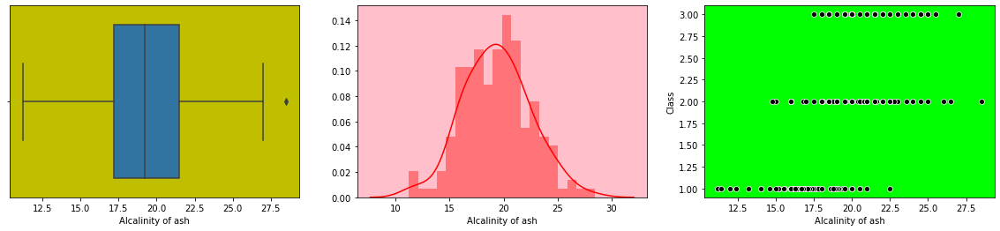

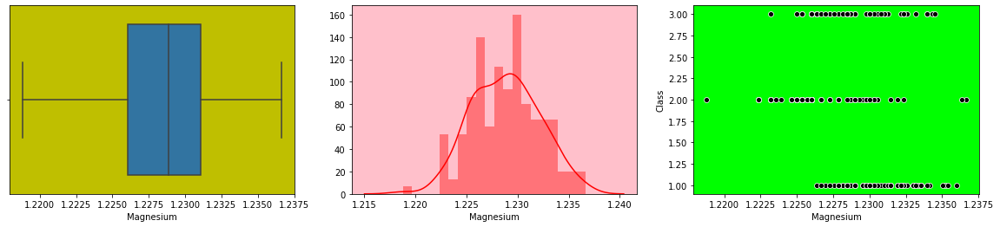

...

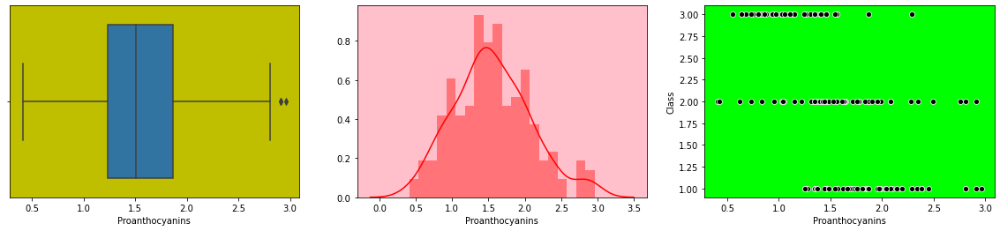

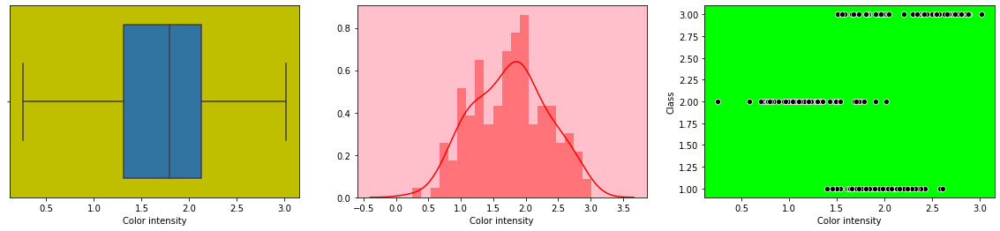

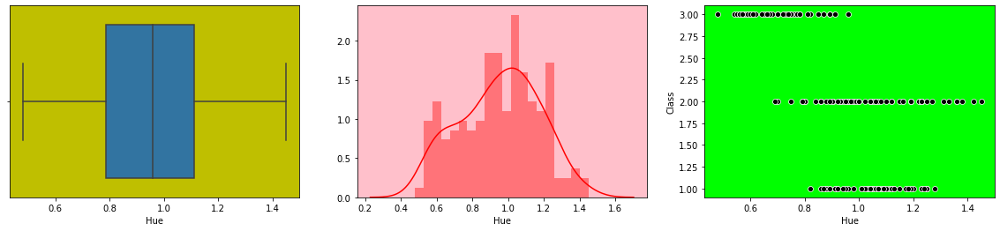

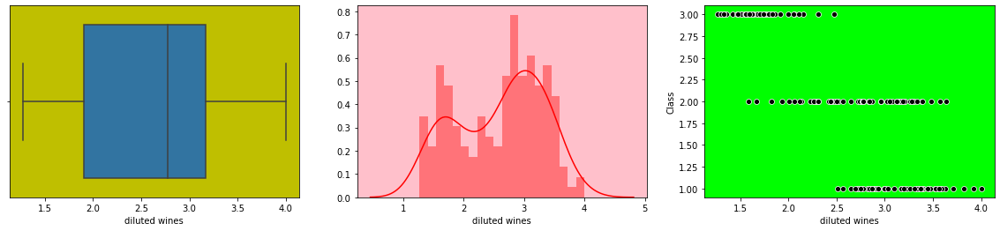

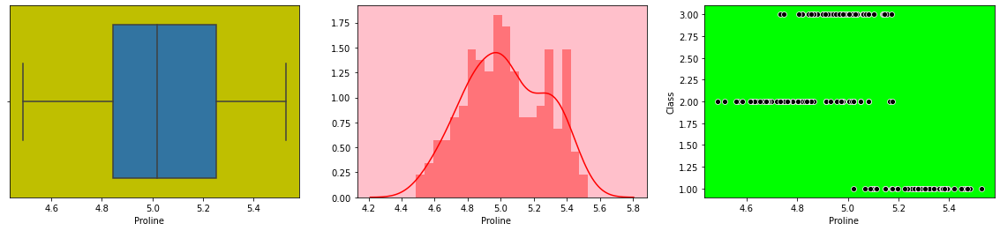

In [23]:
target_variable = "Class"
feature_variable = ['Alcohol', 'Malic acid', 'Ash', 'Alcalinity of ash',
       'Magnesium', 'Total phenols', 'Flavanoids', 'Nonflavanoid phenols',
       'Proanthocyanins', 'Color intensity', 'Hue', 'diluted wines',
       'Proline    ']

def num_plots(feature_name):
    fig, axs = plt.subplots(1, 3, figsize=(20, 4))
    a1=sns.boxplot(x=DF[feature_name], ax=axs[0])
    a1.set_facecolor("y")
    a2=sns.distplot(DF[feature_name], bins=20, kde=True, ax=axs[1],color="r")
    a2.set_facecolor("pink")
    a3=sns.scatterplot(data=DF, x=feature_name, y=target_variable, ax=axs[2], color="k")
    a3.set_facecolor("lime")
    plt.show()
    
for i in feature_variable:
    num_plots(i)

In [24]:
import itertools

cols = ['Alcohol', 'Malic acid', 'Ash', 'Alcalinity of ash',
       'Magnesium', 'Total phenols', 'Flavanoids', 'Nonflavanoid phenols',
       'Proanthocyanins', 'Color intensity', 'Hue', 'diluted wines',
       'Proline    ']
length = len(cols)
cs = ["b","r","#003153","#4B0082","m","k","#e61919","#FF00AF","#FF4500","#003153","#E30B5C","#FF2400","#C71585"]

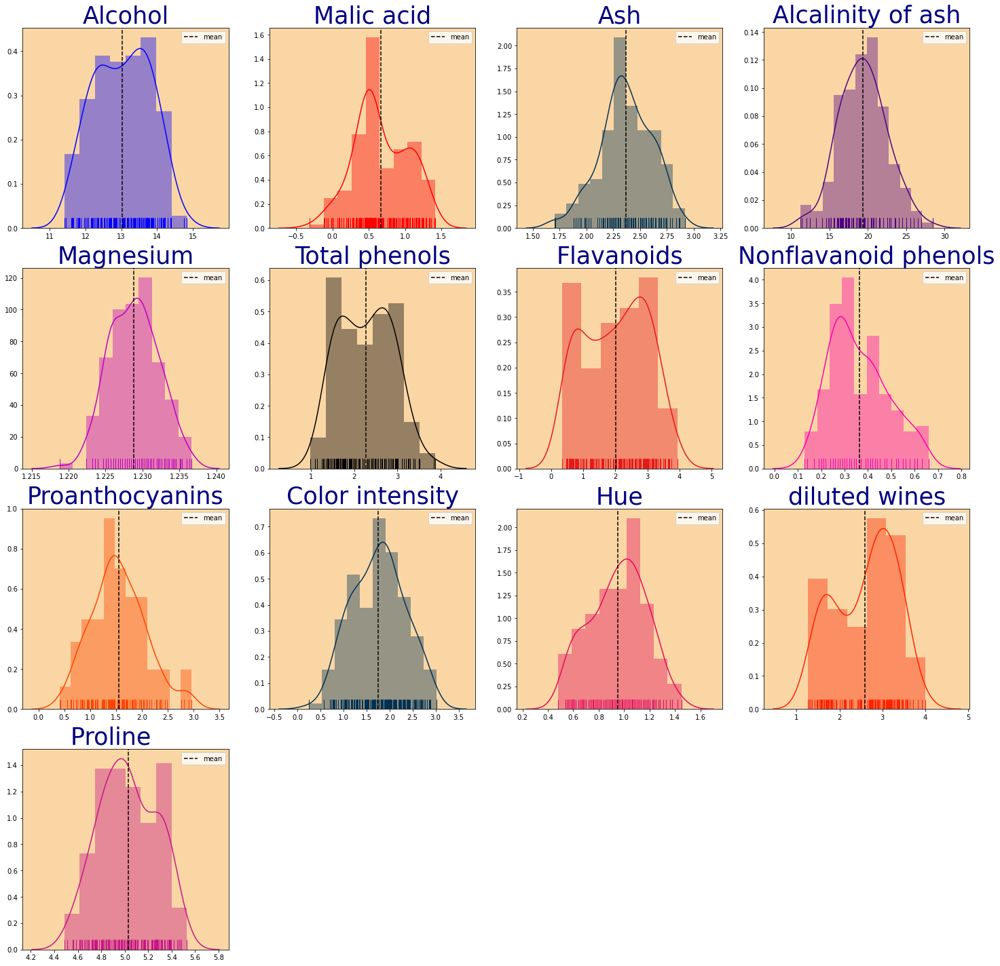

In [25]:
Champagne_Color = "#fad6a5"

plt.figure(figsize=(25,25))
for i,j,k in itertools.zip_longest(cols,range(length),cs):
    plt.subplot(4,4,j+1)
    ax= sns.distplot(DF[i],color=k,rug=True)
    ax.set_facecolor(Champagne_Color)
    plt.axvline(DF[i].mean(), linestyle="dashed", label= "mean", color= "k")
    plt.legend(loc="best")
    plt.title(i,color = "navy", fontsize = 35)
    plt.xlabel("")

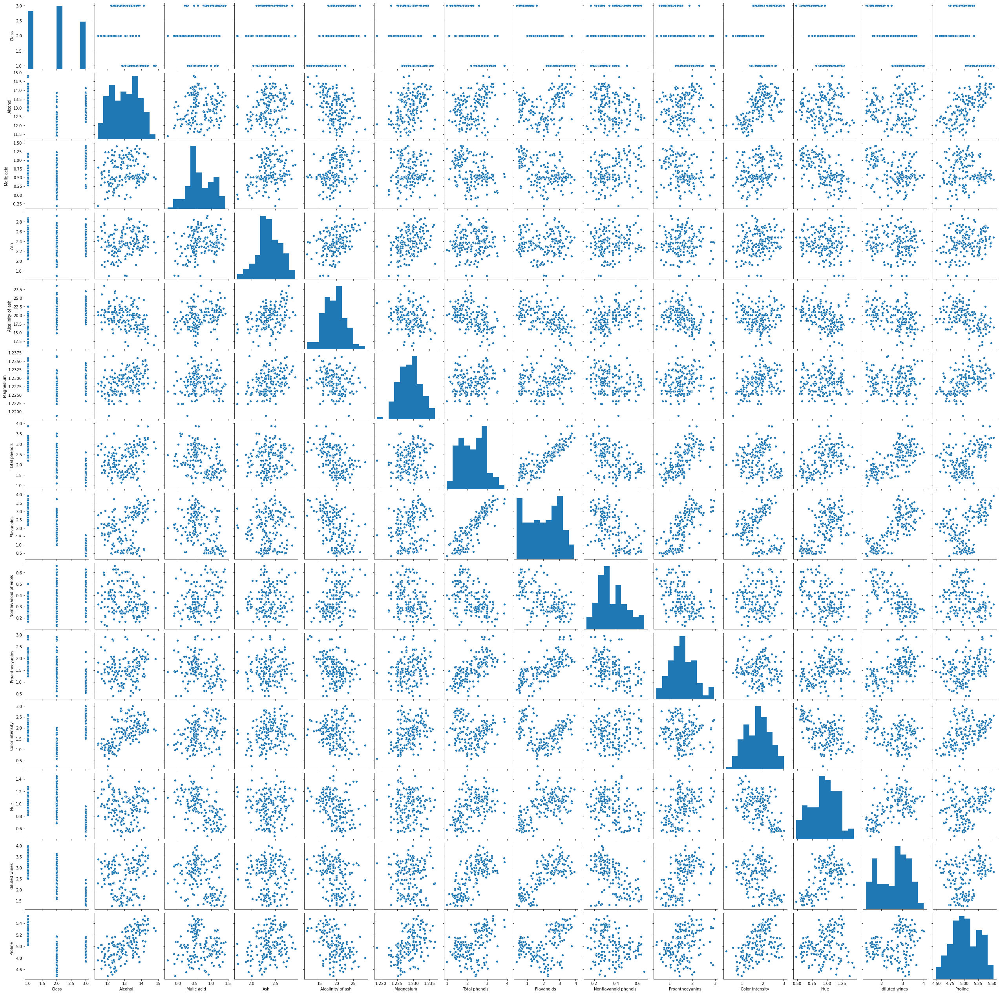

In [26]:
sns.pairplot(DF)
plt.show()

##### Shuffeling the data Since data is following a pattern or sorted by Class Variable

In [27]:
from sklearn.utils import shuffle
DF = shuffle(DF)
DF

,Class,Alcohol,Malic acid,Ash,Alcalinity of ash,Magnesium,Total phenols,Flavanoids,Nonflavanoid phenols,Proanthocyanins,Color intensity,Hue,diluted wines,Proline
44,1,13.05,0.533687,2.10,17.0,1.231241,3.00,3.00,0.28,2.03,1.843697,0.88,3.35,5.174816
63,2,12.37,0.120448,2.16,19.0,1.225690,3.50,3.10,0.19,1.87,1.684381,1.22,2.87,4.739381
16,1,14.30,0.603957,2.72,20.0,1.233947,2.80,3.14,0.33,1.97,2.115832,1.07,2.65,5.380543
165,3,13.73,1.241003,2.26,22.5,1.226021,1.28,0.47,0.52,1.15,2.203821,0.78,1.75,4.866948
7,1,14.06,0.699448,2.61,17.6,1.234133,2.60,2.51,0.31,1.25,1.846259,1.06,3.58,5.386935
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61,2,12.64,0.296444,2.02,16.8,1.229525,2.02,1.41,0.53,0.62,2.015806,0.98,1.59,4.780840
17,1,13.83,0.427582,2.62,20.0,1.232971,2.95,3.40,0.40,1.72,2.199739,1.13,2.57,5.311767
145,3,13.16,1.097051,2.15,21.0,1.230037,1.50,0.55,0.43,1.30,1.550437,0.60,1.68,5.138393
22,1,13.71,0.576694,2.36,16.6,1.229783,2.61,2.88,0.27,1.69,1.486795,1.11,4.00,5.262879


In [28]:
x=DF.drop(["Class"], axis = 1)
y= DF.Class

In [29]:
from sklearn.preprocessing import MinMaxScaler
scaler= MinMaxScaler(feature_range=(1,3)) 
# Since the Class Target variaable has three class we are splitting the feature variable into 3 

In [30]:
X=scaler.fit_transform(x)

# Selecting Parameter for Training 

In [31]:
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.model_selection import train_test_split

In [32]:
accu = 0
for i in range(0,20000):
    x_train, x_test, y_train, y_test = train_test_split(X,y,test_size = .25, random_state = i)
    mod = GaussianNB()
    mod.fit(x_train,y_train)
    y_pred = mod.predict(x_test)
    acc = accuracy_score(y_test,y_pred)
    if acc> accu:
        accu= acc
        best_rstate=i

print(f"Best Accuracy {accu*100} found on randomstate {best_rstate}")

Best Accuracy 100.0 found on randomstate 0


In [33]:
x_train, x_test, y_train, y_test = train_test_split(X,y,test_size = .25, random_state = best_rstate)

# Selecting the Best model for Training

In [34]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.model_selection import RandomizedSearchCV, cross_val_score 
from sklearn.model_selection import cross_validate, cross_val_predict, StratifiedKFold
from sklearn.feature_selection import RFECV
from sklearn.linear_model import SGDClassifier
from sklearn.dummy import DummyClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier, ExtraTreeClassifier
from sklearn import metrics
import xgboost as xgb

import warnings
warnings.filterwarnings('ignore')

# Baseline
             
             
             First, we are going to train a dummy classifier that we will use as a baseline with which to compare.

In [35]:
clf_dummy = DummyClassifier(strategy="uniform", random_state=42) # Random prediction
clf_dummy.fit(x_train, y_train)

DummyClassifier(random_state=42, strategy='uniform')

In [36]:
cross_val_score(clf_dummy, x_train, y_train, cv=5, scoring="accuracy", n_jobs=-1).mean()

0.34153846153846157

In [37]:
clf_dummy = DummyClassifier(strategy="most_frequent", random_state=42) 
clf_dummy.fit(x_train, y_train)

DummyClassifier(random_state=42, strategy='most_frequent')

In [38]:
cross_val_score(clf_dummy, x_train, y_train, cv=5, 
                scoring="accuracy", n_jobs=-1).mean()

0.3729230769230769

In [39]:
preds = cross_val_predict(clf_dummy, x_train, y_train, cv=5, n_jobs=-1)
conf_mx = metrics.confusion_matrix(y_train, preds)
conf_mx

array([[ 0, 44,  0],
       [ 0, 47,  0],
       [ 0, 35,  0]], dtype=int64)

In [40]:
pd.crosstab(y_train, preds, rownames = ['Real'], colnames =['Predicted'])

Predicted,2
Real,
1,44
2,47
3,35


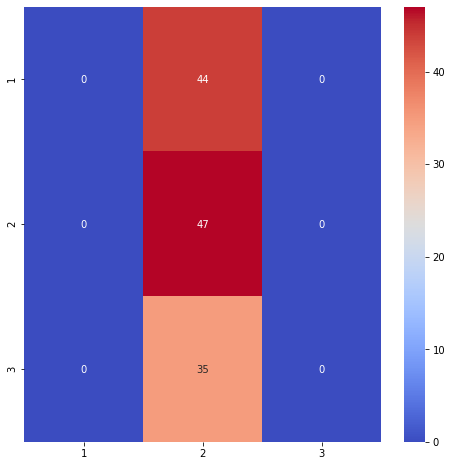

In [41]:
fig = plt.figure(figsize=(8,8))
ax = sns.heatmap(conf_mx, annot=True, fmt="d", 
                 xticklabels=clf_dummy.classes_,
                 yticklabels=clf_dummy.classes_,cmap = "coolwarm")

In [42]:
accuracy_base = metrics.accuracy_score(y_train, preds)
precision_base = metrics.precision_score(y_train, preds, average='weighted', 
                                         zero_division=0)
recall_base = metrics.recall_score(y_train, preds, average='weighted')
f1_base = metrics.f1_score(y_train, preds, average='weighted')
print(f"Accuracy: {accuracy_base}")
print(f"Precision: {precision_base}")
print(f"Recall: {recall_base}")
print(f"f1: {f1_base}")

Accuracy: 0.373015873015873
Precision: 0.1391408415217939
Recall: 0.373015873015873
f1: 0.2026791448756767


In [43]:
print(metrics.classification_report(y_train, preds, zero_division=0))

              precision    recall  f1-score   support

           1       0.00      0.00      0.00        44
           2       0.37      1.00      0.54        47
           3       0.00      0.00      0.00        35

    accuracy                           0.37       126
   macro avg       0.12      0.33      0.18       126
weighted avg       0.14      0.37      0.20       126



# Shortlisting Promissing Models

In [44]:
def evaluate_model(estimator, x_train, y_train, cv=5, verbose=True):
   
    scoring = {"accuracy": "accuracy",
               "precision": "precision_weighted",
               "recall": "recall_weighted",
               "f1": "f1_weighted"}
    scores = cross_validate(estimator, x_train, y_train, cv=cv, scoring=scoring)
    
    accuracy, accuracy_std = scores['test_accuracy'].mean(), \
                                scores['test_accuracy'].std()
    
    precision, precision_std = scores['test_precision'].mean(), \
                                scores['test_precision'].std()
    
    recall, recall_std = scores['test_recall'].mean(), \
                                scores['test_recall'].std()
    
    f1, f1_std = scores['test_f1'].mean(), scores['test_f1'].std()

    
    result = {
        "Accuracy": accuracy,
        "Accuracy std": accuracy_std,
        "Precision": precision,
        "Precision std": precision_std,
        "Recall": recall,
        "Recall std": recall_std,
        "f1": f1,
        "f1 std": f1_std,
    }
    
    if verbose:
        print(f"Accuracy: {accuracy} - (std: {accuracy_std})")
        print(f"Precision: {precision} - (std: {precision_std})")
        print(f"Recall: {recall} - (std: {recall_std})")
        print(f"f1: {f1} - (std: {f1_std})")

    return result

In [45]:
models = [GaussianNB(), KNeighborsClassifier(), RandomForestClassifier(random_state=42),
          DecisionTreeClassifier(random_state=42), ExtraTreeClassifier(random_state=42), 
          AdaBoostClassifier(random_state=42), GradientBoostingClassifier(random_state=42), 
          xgb.XGBClassifier()]

model_names = ["Naive Bayes Gaussian", "K Neighbors Classifier", "Random Forest",
               "Decision Tree", "Extra Tree", "Ada Boost", 
               "Gradient Boosting", "XGBoost"]

In [46]:
accuracy = []
precision = []
recall = []
f1 = []

for model in range(len(models)):
    print(f"\n\nStep {model+1} of {len(models)}")
    print(f".........................running {model_names[model]}")
    
    clf_scores = evaluate_model(models[model], x_train, y_train)
    
    accuracy.append(clf_scores["Accuracy"])
    precision.append(clf_scores["Precision"])
    recall.append(clf_scores["Recall"])
    f1.append(clf_scores["f1"])



Step 1 of 8
.........................running Naive Bayes Gaussian
Accuracy: 0.9923076923076923 - (std: 0.015384615384615375)
Precision: 0.9932692307692307 - (std: 0.013461538461538457)
Recall: 0.9923076923076923 - (std: 0.015384615384615375)
f1: 0.9923616734143049 - (std: 0.015276653171390063)


Step 2 of 8
.........................running K Neighbors Classifier
Accuracy: 0.9446153846153846 - (std: 0.040447204246535334)
Precision: 0.9520552447552447 - (std: 0.03399795815899654)
Recall: 0.9446153846153846 - (std: 0.040447204246535334)
f1: 0.9429175623825777 - (std: 0.04281483938936138)


Step 3 of 8
.........................running Random Forest
Accuracy: 0.9923076923076923 - (std: 0.015384615384615375)
Precision: 0.9932692307692307 - (std: 0.013461538461538457)
Recall: 0.9923076923076923 - (std: 0.015384615384615375)
f1: 0.9923616734143049 - (std: 0.015276653171390063)


Step 4 of 8
.........................running Decision Tree
Accuracy: 0.9203076923076923 - (std: 0.0567890313602920

In [47]:
df_result = pd.DataFrame({"Model": model_names,
                          "accuracy": accuracy,
                          "precision": precision,
                          "recall": recall,
                          "f1": f1})
df_result.sort_values(by="f1", ascending=False)

,Model,accuracy,precision,recall,f1
0,Naive Bayes Gaussian,0.992308,0.993269,0.992308,0.992362
2,Random Forest,0.992308,0.993269,0.992308,0.992362
6,Gradient Boosting,0.968308,0.969807,0.968308,0.968240
7,XGBoost,0.960615,0.967943,0.960615,0.960646
1,K Neighbors Classifier,0.944615,0.952055,0.944615,0.942918
3,Decision Tree,0.920308,0.927087,0.920308,0.919295
4,Extra Tree,0.864000,0.892527,0.864000,0.862257
5,Ada Boost,0.819385,0.808483,0.819385,0.803218


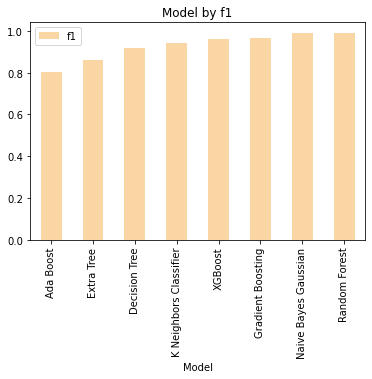

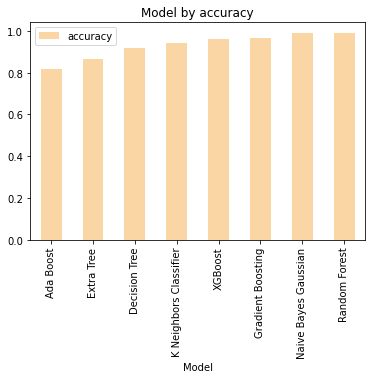

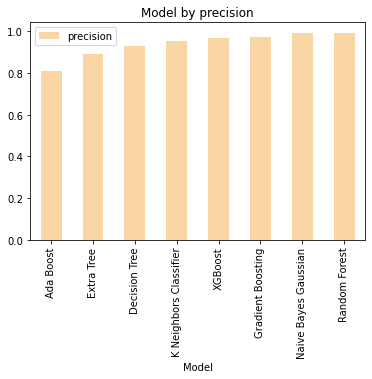

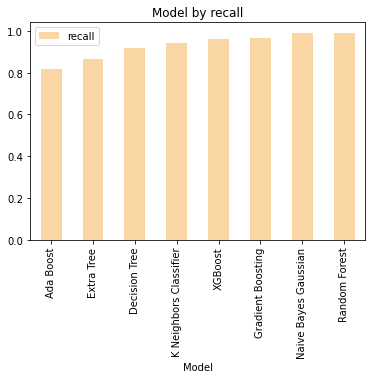

In [48]:
metrics_list = ["f1", "accuracy", "precision", "recall"]

for metric in metrics_list:
    df_result.sort_values(by=metric).plot.bar("Model", metric, color = Champagne_Color)
    plt.title(f"Model by {metric}")
    plt.show()

# THE ABOVE OBSEVATION SHOWS THAT:
    RANDOMFOREST and NAIVE BAYES GAUSSIAN performs well and tops the chart as
    Accuracy: 0.992
    Precision: 0.993
    Recall: 0.992
    f1: 0.9920561403508771

In [49]:
clf_rf = RandomForestClassifier(random_state=42)
preds = cross_val_predict(clf_rf, x_train, y_train, cv=5, n_jobs=-1)

In [50]:
clf_rf.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 42,
 'verbose': 0,
 'warm_start': False}

In [51]:
pd.crosstab(y_train, preds, rownames = ['Real'], colnames =['Predicted'])

Predicted,1,2,3
Real,,,
1,44,0,0
2,0,46,1
3,0,0,35


In [52]:
print(metrics.classification_report(y_train, preds, zero_division=0))

              precision    recall  f1-score   support

           1       1.00      1.00      1.00        44
           2       1.00      0.98      0.99        47
           3       0.97      1.00      0.99        35

    accuracy                           0.99       126
   macro avg       0.99      0.99      0.99       126
weighted avg       0.99      0.99      0.99       126



# HYPER TUNING....

In [53]:
param_grid = [
    {"n_estimators": range(20, 200, 20), 
     "bootstrap": [True, False],
     "criterion": ["gini", "entropy"],   
     "max_depth": [2, 4, 6, 8, 10, 12, 14, None],
     "max_features": ["auto", "sqrt", "log2"], 
     "min_samples_split": [2, 5, 10],
     "min_samples_leaf": [1, 2, 4],
     }
]

clf_rf = RandomForestClassifier(random_state=42, n_jobs=-1)

In [54]:
clf_random = RandomizedSearchCV(clf_rf, param_grid, n_iter = 200, cv = 5, 
                                scoring="f1_weighted", verbose=2, 
                                random_state=42, n_jobs = -1)

In [55]:
clf_random.fit(x_train, y_train)

Fitting 5 folds for each of 200 candidates, totalling 1000 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:   23.3s
[Parallel(n_jobs=-1)]: Done 357 tasks      | elapsed:   49.6s
[Parallel(n_jobs=-1)]: Done 640 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 1000 out of 1000 | elapsed:  2.4min finished


RandomizedSearchCV(cv=5,
                   estimator=RandomForestClassifier(n_jobs=-1, random_state=42),
                   n_iter=200, n_jobs=-1,
                   param_distributions=[{'bootstrap': [True, False],
                                         'criterion': ['gini', 'entropy'],
                                         'max_depth': [2, 4, 6, 8, 10, 12, 14,
                                                       None],
                                         'max_features': ['auto', 'sqrt',
                                                          'log2'],
                                         'min_samples_leaf': [1, 2, 4],
                                         'min_samples_split': [2, 5, 10],
                                         'n_estimators': range(20, 200, 20)}],
                   random_state=42, scoring='f1_weighted', verbose=2)

In [56]:
clf_random.best_params_

{'n_estimators': 180,
 'min_samples_split': 5,
 'min_samples_leaf': 2,
 'max_features': 'log2',
 'max_depth': 12,
 'criterion': 'gini',
 'bootstrap': True}

In [57]:
preds = cross_val_predict(clf_random.best_estimator_, x_train, y_train, cv=5, n_jobs=-1)
print(metrics.classification_report(y_train, preds, zero_division=0))

              precision    recall  f1-score   support

           1       1.00      1.00      1.00        44
           2       1.00      0.98      0.99        47
           3       0.97      1.00      0.99        35

    accuracy                           0.99       126
   macro avg       0.99      0.99      0.99       126
weighted avg       0.99      0.99      0.99       126



# Final fine-tune with GridSearch


In [59]:
param_grid = [
    {"n_estimators": range(20, 100, 10), 
     "bootstrap": [True, False],
     "criterion": ["gini", "entropy"],   
     "max_depth": [2, 4, 6, 8, 10, 12, 14, None],
     "max_features": ["auto", "sqrt", "log2"], 
     "min_samples_split": [2, 5, 10],
     "min_samples_leaf": [1, 2, 4],
     }
]


clf_rf = RandomForestClassifier(random_state=42, n_jobs=-1)

In [60]:
grid_search = GridSearchCV(clf_rf, param_grid, cv=5,
                           scoring="f1_weighted", verbose=2, n_jobs=-1)

In [61]:
grid_search.fit(x_train, y_train)

Fitting 5 folds for each of 6912 candidates, totalling 34560 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  58 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done 300 tasks      | elapsed:   27.2s
[Parallel(n_jobs=-1)]: Done 706 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 1272 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 2002 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 2574 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 3101 tasks      | elapsed:  4.2min
[Parallel(n_jobs=-1)]: Done 3708 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 4397 tasks      | elapsed:  5.9min
[Parallel(n_jobs=-1)]: Done 5166 tasks      | elapsed:  7.0min
[Parallel(n_jobs=-1)]: Done 6017 tasks      | elapsed:  8.1min
[Parallel(n_jobs=-1)]: Done 6948 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 7961 tasks      | elapsed: 10.7min
[Parallel(n_jobs=-1)]: Done 9054 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 10229 tasks      

GridSearchCV(cv=5, estimator=RandomForestClassifier(n_jobs=-1, random_state=42),
             n_jobs=-1,
             param_grid=[{'bootstrap': [True, False],
                          'criterion': ['gini', 'entropy'],
                          'max_depth': [2, 4, 6, 8, 10, 12, 14, None],
                          'max_features': ['auto', 'sqrt', 'log2'],
                          'min_samples_leaf': [1, 2, 4],
                          'min_samples_split': [2, 5, 10],
                          'n_estimators': range(20, 100, 10)}],
             scoring='f1_weighted', verbose=2)

In [62]:
grid_search.best_params_

{'bootstrap': True,
 'criterion': 'gini',
 'max_depth': 6,
 'max_features': 'auto',
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 50}

In [63]:
final_model = grid_search.best_estimator_
preds = cross_val_predict(final_model, x_train, y_train, cv=5, n_jobs=-1)
preds

array([2, 3, 3, 1, 1, 1, 2, 2, 1, 1, 2, 2, 2, 2, 1, 3, 2, 3, 1, 3, 3, 1,
       3, 2, 1, 3, 3, 2, 1, 2, 3, 2, 1, 1, 2, 2, 3, 2, 2, 1, 2, 1, 3, 3,
       2, 2, 3, 1, 3, 2, 3, 3, 3, 2, 1, 2, 3, 1, 3, 1, 2, 3, 2, 2, 2, 1,
       2, 3, 1, 2, 2, 1, 2, 3, 2, 3, 2, 1, 2, 2, 2, 2, 1, 1, 1, 1, 1, 3,
       3, 1, 3, 2, 2, 2, 2, 1, 2, 2, 3, 1, 1, 3, 1, 1, 3, 1, 2, 1, 3, 3,
       3, 1, 3, 2, 1, 2, 1, 2, 1, 1, 1, 1, 2, 1, 3, 1], dtype=int64)

In [64]:
pd.crosstab(y_train, preds, rownames = ['Actual'], colnames =['Predicted'])

Predicted,1,2,3
Actual,,,
1,44,0,0
2,0,47,0
3,0,0,35


In [65]:
print(metrics.classification_report(y_train, preds))

              precision    recall  f1-score   support

           1       1.00      1.00      1.00        44
           2       1.00      1.00      1.00        47
           3       1.00      1.00      1.00        35

    accuracy                           1.00       126
   macro avg       1.00      1.00      1.00       126
weighted avg       1.00      1.00      1.00       126



In [66]:
y_pred = final_model.predict(x_test)

pd.crosstab(y_test, y_pred, rownames = ['Actual'], colnames =['Predicted'])

Predicted,1,2,3
Actual,,,
1,14,0,0
2,0,16,0
3,0,0,12


In [67]:
print(metrics.classification_report(y_test, y_pred, zero_division=0))

              precision    recall  f1-score   support

           1       1.00      1.00      1.00        14
           2       1.00      1.00      1.00        16
           3       1.00      1.00      1.00        12

    accuracy                           1.00        42
   macro avg       1.00      1.00      1.00        42
weighted avg       1.00      1.00      1.00        42



In [68]:
conf_mx = metrics.confusion_matrix(y_test, y_pred)

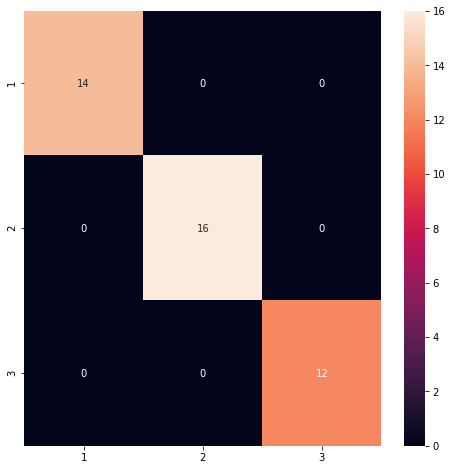

In [69]:
fig = plt.figure(figsize=(8,8))
ax = sns.heatmap(conf_mx, annot=True, fmt="d", 
                 xticklabels=final_model.classes_,
                 yticklabels=final_model.classes_,)

In [70]:
feature_importances = final_model.feature_importances_
feature_importances

array([0.11478271, 0.0358772 , 0.01065177, 0.01080367, 0.05001315,
       0.02647498, 0.2471091 , 0.00629651, 0.02350145, 0.12618269,
       0.08373841, 0.07900153, 0.18556682])

In [71]:
selector = RFECV(final_model, step=1, cv=StratifiedKFold())
selector = selector.fit(x_train, y_train)

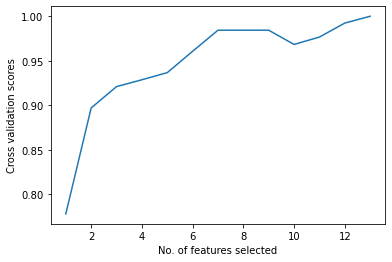

In [72]:
plt.figure()
plt.xlabel("No. of features selected")
plt.ylabel("Cross validation scores")
plt.plot(range(1, len(selector.grid_scores_) + 1), selector.grid_scores_)
plt.show()

In [73]:
selector.grid_scores_

array([0.77784615, 0.89692308, 0.92092308, 0.92861538, 0.93661538,
       0.96061538, 0.98430769, 0.98430769, 0.98430769, 0.96830769,
       0.97661538, 0.99230769, 1.        ])

# Saving the final model

In [74]:
import joblib

In [75]:
joblib.dump(final_model,"Wine_Quaity.obj")

['Wine_Quaity.obj']

In [76]:
Wine_mod = joblib.load("Wine_Quaity.obj")
prediction = Wine_mod.predict(x_test)
prediction

array([2, 1, 2, 1, 3, 3, 1, 1, 1, 1, 2, 2, 3, 3, 2, 3, 3, 2, 2, 1, 3, 1,
       1, 1, 3, 2, 2, 1, 3, 3, 2, 1, 1, 1, 2, 3, 2, 2, 2, 3, 2, 2],
      dtype=int64)

In [77]:
print("Model Score test data :" ,Wine_mod.score(x_test,y_test))

Model Score test data : 1.0


In [78]:
print("Accuracy score is :",accuracy_score(y_test,prediction))

Accuracy score is : 1.0
